In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string

df = pd.read_csv("/Volumes/workspace/default/medical_transcription/mtsamples.csv")
df.head(5)
display(df)
df.columns
df.describe()
df.info()
df.isnull().sum()
df.shape

Unnamed: 0 description medical_specialty sample_name transcription keywords 0 A 23-year-old white female presents with complaint of allergies. Allergy / Immunology Allergic Rhinitis SUBJECTIVE:, This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS: , Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78.,HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. allergy / immunology, allergic rhinitis, allergies, asthma, nasal sprays, rhinitis, nasal, erythematous, allegra, sprays, allergic, 1 Consult for laparoscopic gastric bypass. Bariatrics Laparoscopic Gastric Bypass Consult - 2 PAST MEDICAL HISTORY:, He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago. ,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:, None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If ,he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS: ,Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalit

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         4999 non-null   int64 
 1   description        4999 non-null   object
 2   medical_specialty  4999 non-null   object
 3   sample_name        4999 non-null   object
 4   transcription      4966 non-null   object
 5   keywords           3931 non-null   object
dtypes: int64(1), object(5)
memory usage: 234.5+ KB


(4999, 6)

In [0]:
# Columns transcription and keywords have null values. Cleaning up for further analysis.
#  Null values are seen in transcription and keywords.
#  Only removing null values in column transcription and medical_specialty

df_1 = df.dropna(subset=['transcription','medical_specialty']) # these are two important columns for analysis 
print(df_1.shape)

import re
# Clean the text in transcription column
df_1['clean_transcription'] = df_1['transcription'].apply(lambda x: re.sub(r'(\.,)', ". ", x))
print(df_1['clean_transcription'].iloc[65])
df_1.info()



(4966, 6)
HISTORY:,  This 75-year-old man was transferred from the nursing home where he lived to the hospital late at night on 4/11 through the Emergency Department in complete urinary obstruction.  After catheterization, the patient underwent cystoscopy on 4/13.  On 4/14 the patient underwent a transurethral resection of the prostate and was discharged back to the nursing home later that day with voiding improved.  Final diagnosis was adenocarcinoma of the prostate.  Because of his mental status and general debility, the patient's family declined additional treatment. LABORATORY:,  None,PROCEDURES:,Cystoscopy:  Blockage of the urethra by a markedly enlarged prostate. Transurethral resection of prostate:  45 grams of tissue were sent to the Pathology Department for analysis. PATHOLOGY: , Well differentiated adenocarcinoma, microacinar type, in 1 of 25 chips of prostatic tissue.
<class 'pandas.core.frame.DataFrame'>
Index: 4966 entries, 0 to 4998
Data columns (total 7 columns):
 #   Co

/home/spark-727f2033-6f39-4b23-bf8d-5c/.ipykernel/2900/command-4514575752093222-2536194767:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['clean_transcription'] = df_1['transcription'].apply(lambda x: re.sub(r'(\.,)', ". ", x))


In [0]:

#  Convert Pandas to PySpark DataFrame
spark_df = spark.createDataFrame(df_1)

# Display the Spark DataFrame
display(spark_df)

Unnamed: 0 description medical_specialty sample_name transcription keywords clean_transcription 0 A 23-year-old white female presents with complaint of allergies. Allergy / Immunology Allergic Rhinitis SUBJECTIVE:, This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS: , Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78.,HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. allergy / immunology, allergic rhinitis, allergies, asthma, nasal sprays, rhinitis, nasal, erythematous, allegra, sprays, allergic, SUBJECTIVE:, This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up. MEDICATIONS: , Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: , She has no known medicine allergies. OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT:, Allergic rhinitis. PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. 2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. 1 Consult for laparoscopic gastric bypass. Bariatrics Laparoscopic Gastric Bypass Consult - 2 PAST MEDICAL HISTORY:, He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago. ,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:, None.,ALLERGIES:, He is allergic to Penicillin.,MIS

In [0]:
%pip install spacy scispacy
%pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.4/en_ner_bc5cdr_md-0.5.4.tar.gz

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
  Using cached https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.4/en_ner_bc5cdr_md-0.5.4.tar.gz (119.8 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import spacy

# Load the model
nlp = spacy.load("en_ner_bc5cdr_md")

# Process the first transcription as an example
sample_text = df_1["clean_transcription"].iloc[0]
doc_1 = nlp(sample_text)

print("TEXT", "START", "END", "ENTITY TYPE")
for ent in doc_1.ents:
    print(ent.text, ent.start_char, ent.end_char, ent.label_)


TEXT START END ENTITY TYPE
complaint of allergies 58 80 DISEASE
allergies 100 109 DISEASE
Claritin 200 208 CHEMICAL
Zyrtec 214 220 CHEMICAL
asthma 520 526 DISEASE
Tri-Cyclen 666 676 CHEMICAL
medicine allergies 724 742 DISEASE
throat 825 831 DISEASE
adenopathy 987 997 DISEASE
Allergic rhinitis 1028 1045 DISEASE
Zyrtec 1070 1076 CHEMICAL
loratadine 1134 1144 CHEMICAL
Nasonex 1237 1244 CHEMICAL


In [0]:
# print the first row for transcription using displacy
# Here I am printing just the first 100 tokens
from spacy import displacy
displacy.render(doc_1[:150], style='ent', jupyter=True)


In [0]:
# Convert the entities to a Pandas DataFrame
entities = [(ent.text, ent.label_,ent.lemma_) for ent in doc_1.ents]
entity_df = pd.DataFrame(entities, columns=['Entity', 'Label','Lemma'])
display(entity_df)

#  Get the unique entities and their counts
entity_counts = entity_df['Entity'].value_counts().reset_index()
entity_counts.columns = ['Entity', 'Count']
entity_counts.head()

Entity,Label,Lemma
complaint of allergies,DISEASE,complaint of allergy
allergies,DISEASE,allergy
Claritin,CHEMICAL,claritin
Zyrtec,CHEMICAL,zyrtec
asthma,DISEASE,asthma
Tri-Cyclen,CHEMICAL,Tri-Cyclen
medicine allergies,DISEASE,medicine allergy
throat,DISEASE,throat
adenopathy,DISEASE,adenopathy
Allergic rhinitis,DISEASE,allergic rhinitis


,Entity,Count
0,Zyrtec,2
1,complaint of allergies,1
2,allergies,1
3,Claritin,1
4,asthma,1


In [0]:
# Applying NER Rule_Based_Matching to look for drug name and their dosages

from spacy.matcher import Matcher

pattern = [{'ENT_TYPE':'CHEMICAL'}, {'LIKE_NUM': True}, {'IS_ASCII': True}]
matcher = Matcher(nlp.vocab)
matcher.add("DRUG_DOSE", [pattern])

matched_spans = []

for clean_text in df_1['clean_transcription']:
    doc = nlp(clean_text)
    matches = matcher(doc)
    for match_id, start, end in matches:
        string_id = nlp.vocab.strings[match_id]
        matched_span = doc[start:end]
        matched_spans.append((string_id, start, end, matched_span.text))

if matched_spans:
    matched_span_df = pd.DataFrame(matched_spans, columns=['String_id','Start','End','Matched_Span'])
    display(matched_span_df)
else:
    print("No drug-dose patterns found matching the pattern: CHEMICAL + number + ASCII text")

String_id,Start,End,Matched_Span
DRUG_DOSE,254,257,Nasonex two sprays
DRUG_DOSE,325,328,alcohol ten to
DRUG_DOSE,113,116,Crestor 20 mg
DRUG_DOSE,138,141,ibuprofen two to
DRUG_DOSE,159,162,lidocaine 2%
DRUG_DOSE,170,173,bupivacaine 0.5%
DRUG_DOSE,21,24,Technetium 99m
DRUG_DOSE,70,73,creatinine 1.1.
DRUG_DOSE,325,328,Toprol 50 mg
DRUG_DOSE,332,335,Clonidine 0.2 mg


In [0]:
# Step 1: Define a function to apply NER model and rule-based matching
def extract_entities_and_matches(text):
    doc = nlp(text)
    # Extract NER entities
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    # Rule-based matching for drug-dose patterns
    pattern = [{'ENT_TYPE':'CHEMICAL'}, {'LIKE_NUM': True}, {'IS_ASCII': True}]
    matcher = Matcher(nlp.vocab)
    matcher.add("DRUG_DOSE", [pattern])
    matches = matcher(doc)
    string_id = nlp.vocab.strings[match_id]
    matched_spans = [doc[start:end].text for match_id, start, end in matches]
    return {"entities": entities, "string_id": string_id,"START": start, "END":end, "matched_spans": matched_spans}

# Step 2: Apply the function to each row of df_1['clean_transcription']
df_1['ner_results'] = df_1['clean_transcription'].apply(extract_entities_and_matches)

# Step 3: Convert the results to a Spark DataFrame for saving to a database
spark_ner_df = spark.createDataFrame(df_1[['clean_transcription', 'ner_results']])

# Step 4: Save the Spark DataFrame to a database table
spark_ner_df.write.format("delta").mode("overwrite").saveAsTable("medical_transcription_ner_results")

/home/spark-727f2033-6f39-4b23-bf8d-5c/.ipykernel/2900/command-6524948812071164-1925014458:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['ner_results'] = df_1['clean_transcription'].apply(extract_entities_and_matches)


In [0]:
df_results = spark.table("medical_transcription_ner_results")
display(df_results.limit(10))

clean_transcription ner_results INDICATION: , Iron deficiency anemia. PROCEDURE: ,Colonoscopy with terminal ileum examination. POSTOPERATIVE DIAGNOSIS:, Normal examination. WITHDRAWAL TIME: , 15 minutes. SCOPE: , CF-H180AL. MEDICATIONS: , Fentanyl 100 mcg and versed 10 mg. PROCEDURE DETAIL: ,Following the preprocedure patient assessment the procedure, goals, risks including bleeding, perforation, missed polyp rate as well as side effects of medications and alternatives were reviewed. Questions were answered. Pause preprocedure was performed. Following titrated intravenous sedation the flexible video endoscope was introduced into the rectum and advanced to the cecum without difficulty. The ileocecal valve looked normal. Preparation was fair allowing examination of 85% of mucosa after washing and cleaning with tap water through the scope. The terminal ileum was intubated through the ileocecal valve for a 5 cm extent. Terminal ileum mucosa looked normal. Then the scope was withdrawn while examining the mucosa carefully including the retroflexed views of the rectum. No polyp, no diverticulum and no bleeding source was identified. The patient was assessed upon completion of the procedure. Okay to discharge once criteria met. ,RECOMMENDATIONS:, Follow up with primary care physician. List(List(List(Iron, CHEMICAL), List(anemia, DISEASE), List(Fentanyl, CHEMICAL), List(bleeding, DISEASE), List(perforation, DISEASE), List(polyp, DISEASE), List(polyp, DISEASE), List(diverticulum, DISEASE), List(bleeding, DISEASE)), List(Fentanyl 100 mcg)) PREOPERATIVE DIAGNOSES: , Colon cancer screening and family history of polyps. POSTOPERATIVE DIAGNOSIS:, Colonic polyps. PROCEDURE:, Colonoscopy. ANESTHESIA:, MAC,DESCRIPTION OF PROCEDURE: ,The Olympus pediatric variable colonoscope was introduced into the rectum and advanced carefully through the colon into the cecum and then through the ileocecal valve into the terminal ileum. The preparation was excellent and all surfaces were well seen. The mucosa was normal throughout the colon and in the terminal ileum. Two polyps were identified and were removed. The first was a 7-mm sessile lesion in the mid transverse colon at 110 cm, removed with the snare without cautery and retrieved. The second was a small 4-mm sessile lesion in the sigmoid colon at 20 cm also removed with the snare and retrieved. No other lesions were identified. Numerous diverticula were found in the sigmoid colon. A retroflex through the anorectal junction showed moderate internal hemorrhoids. The patient tolerated the procedure well and was sent to the recovery room. FINAL DIAGNOSES:,1. Sigmoid diverticulosis. 2. Colonic polyps in the transverse colon and sigmoid colon, benign appearance, removed. 3. Internal hemorrhoids. 4. Otherwise normal colonoscopy to the terminal ileum. RECOMMENDATIONS:,1. Follow up biopsy report. 2. Follow up with Dr. X as needed. 3. Screening colonoscopy in 5 years. List(List(List(Colon cancer, DISEASE), List(polyps, DISEASE), List(diverticula, DISEASE), List(hemorrhoids, DISEASE), List(Sigmoid diverticulosis, DISEASE)), List()) PROCEDURE:, Colonoscopy. PREOPERATIVE DIAGNOSES: , Change in bowel habits and rectal prolapse. POSTOPERATIVE DIAGNOSIS: , Normal colonoscopy. PROCEDURE: ,The Olympus pediatric variable colonoscope was introduced through the rectum and advanced carefully through the colon to the cecum identified by the ileocecal valve and the appendiceal orifice. The preparation was poor, but mucosa was visible after lavage and suction. Small lesions might have been missed in certain places, but no large lesions are likely to have been missed. The mucosa was normal, was visualized. In particular, there was no mucosal abnormality in the rectum and distal sigmoid, which is reported to be prolapsing. Biopsies were taken from the rectal wall to look for microscopic changes. The anal sphincter was considerably relaxed, with no tone and a gaping opening. The patient tolerated the procedure well and was sent to

In [0]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"\n", " ", text)
    #text = re.sub(r"[0-9]", " ", text)
    text = text.translate(str.maketrans("", "", string.punctuation))
    text = re.sub(r"\s+", " ", text).strip()
    return text

# Create a new dataframe df_2 from df_1['description'] and apply clean_text
df_2 = pd.DataFrame()
df_2['description'] = df_1['description']
df_2['clean_description'] = df_2['description'].apply(clean_text)
display(df_2)

description,clean_description
A 23-year-old white female presents with complaint of allergies.,a 23yearold white female presents with complaint of allergies
Consult for laparoscopic gastric bypass.,consult for laparoscopic gastric bypass
Consult for laparoscopic gastric bypass.,consult for laparoscopic gastric bypass
2-D M-Mode. Doppler.,2d mmode doppler
2-D Echocardiogram,2d echocardiogram
"Morbid obesity. Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis. This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful.",morbid obesity laparoscopic antecolic antegastric rouxeny gastric bypass with eea anastomosis this is a 30yearold female who has been overweight for many years she has tried many different diets but is unsuccessful
"Liposuction of the supraumbilical abdomen, revision of right breast reconstruction, excision of soft tissue fullness of the lateral abdomen and flank.",liposuction of the supraumbilical abdomen revision of right breast reconstruction excision of soft tissue fullness of the lateral abdomen and flank
2-D Echocardiogram,2d echocardiogram
Suction-assisted lipectomy - lipodystrophy of the abdomen and thighs.,suctionassisted lipectomy lipodystrophy of the abdomen and thighs
Echocardiogram and Doppler,echocardiogram and doppler


In [0]:
# Process the first description as an example
sample_1_text = df_1["description"].iloc[250]
doc_1 = nlp(sample_1_text)

print("TEXT", "START", "END", "ENTITY TYPE")
for ent in doc_1.ents:
    print(ent.text, ent.start_char, ent.end_char, ent.label_)


TEXT START END ENTITY TYPE
NexGen left 1 12 CHEMICAL
arthritis 51 60 DISEASE
knee pain 140 149 DISEASE


In [0]:
# Create a new dataframe df_2 from df_1 with columns 'transcription' and 'medical_specialty'
df_2 = df_1[['transcription', 'medical_specialty']].copy()
print(df_2.head())
def clean_text(text):
    text = text.lower()
    text = re.sub(r"\n", " ", text)
    #text = re.sub(r"[0-9]", " ", text)
    text = text.translate(str.maketrans("", "", string.punctuation))
    text = re.sub(r"\s+", " ", text).strip()
    return text

# Apply complete text cleaning for Trancription column
df_2['clean_transcription'] = df_2['transcription'].apply(clean_text)
df_2.head()


                                       transcription            medical_specialty
0  SUBJECTIVE:,  This 23-year-old white female pr...         Allergy / Immunology
1  PAST MEDICAL HISTORY:, He has difficulty climb...                   Bariatrics
2  HISTORY OF PRESENT ILLNESS: , I have seen ABC ...                   Bariatrics
3  2-D M-MODE: , ,1.  Left atrial enlargement wit...   Cardiovascular / Pulmonary
4  1.  The left ventricular cavity size and wall ...   Cardiovascular / Pulmonary


,transcription,medical_specialty,clean_transcription
0,"SUBJECTIVE:, This 23-year-old white female pr...",Allergy / Immunology,subjective this 23yearold white female present...
1,"PAST MEDICAL HISTORY:, He has difficulty climb...",Bariatrics,past medical history he has difficulty climbin...
2,"HISTORY OF PRESENT ILLNESS: , I have seen ABC ...",Bariatrics,history of present illness i have seen abc tod...
3,"2-D M-MODE: , ,1. Left atrial enlargement wit...",Cardiovascular / Pulmonary,2d mmode 1 left atrial enlargement with left a...
4,1. The left ventricular cavity size and wall ...,Cardiovascular / Pulmonary,1 the left ventricular cavity size and wall th...


In [0]:
# Remove "\"" or "-"" from the medical_specialty column
df_2['medical_specialty'] = df_2['medical_specialty'].str.replace(r'\\', '')
specialities = df_2['medical_specialty'].unique()
print(specialities)


[' Allergy / Immunology' ' Bariatrics' ' Cardiovascular / Pulmonary'
 ' Neurology' ' Dentistry' ' Urology' ' General Medicine' ' Surgery'
 ' Speech - Language' ' SOAP / Chart / Progress Notes' ' Sleep Medicine'
 ' Rheumatology' ' Radiology' ' Psychiatry / Psychology' ' Podiatry'
 ' Physical Medicine - Rehab' ' Pediatrics - Neonatal' ' Pain Management'
 ' Orthopedic' ' Ophthalmology' ' Office Notes' ' Obstetrics / Gynecology'
 ' Neurosurgery' ' Nephrology' ' Letters' ' Lab Medicine - Pathology'
 ' IME-QME-Work Comp etc.' ' Hospice - Palliative Care'
 ' Hematology - Oncology' ' Gastroenterology' ' ENT - Otolaryngology'
 ' Endocrinology' ' Emergency Room Reports' ' Discharge Summary'
 ' Diets and Nutritions' ' Dermatology' ' Cosmetic / Plastic Surgery'
 ' Consult - History and Phy.' ' Chiropractic' ' Autopsy']


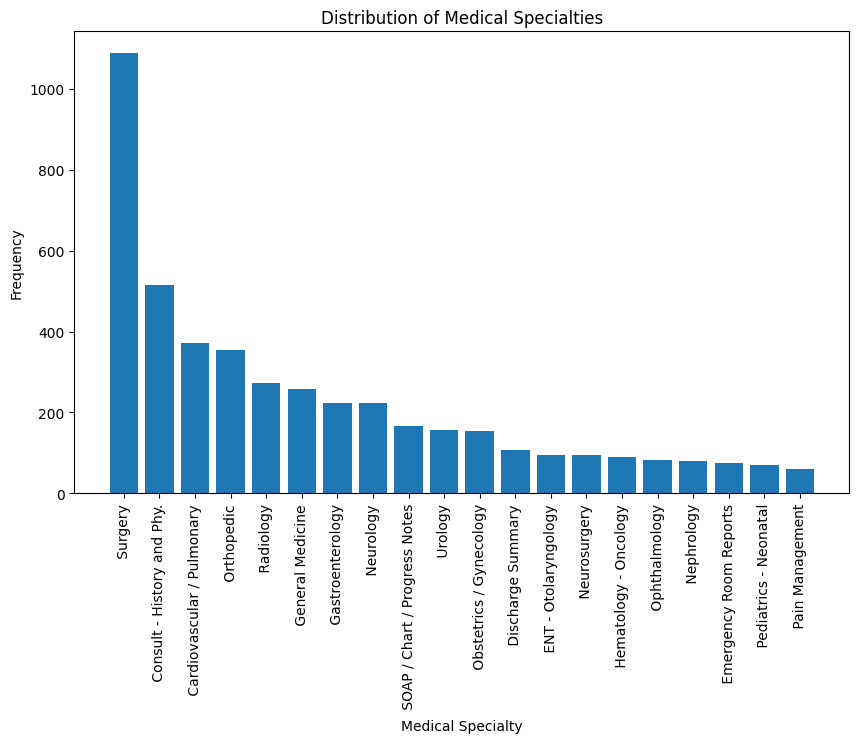

In [0]:
# plot medical specialties
plt.figure(figsize=(10, 6))
specialty_counts = df_2['medical_specialty'].value_counts().head(20)
plt.bar(specialty_counts.index, specialty_counts.values)
plt.xlabel('Medical Specialty')
plt.ylabel('Frequency')
plt.title('Distribution of Medical Specialties')
plt.xticks(rotation=90)
plt.show()
# Save the cleaned dataframe to a database table


In [0]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
X = df_2["clean_transcription"]
y = df_2["medical_specialty"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train.shape, X_test.shape

((3972,), (994,))

In [0]:
%pip install sentence-transformers

from sentence_transformers import SentenceTransformer

model = SentenceTransformer('pritamdeka/S-PubMedBert-MS-MARCO')

X_train_embeddings = model.encode(X_train.astype(str).tolist(), show_progress_bar=True)
X_test_embeddings = model.encode(X_test.astype(str).tolist(), show_progress_bar=True)

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/123 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/666 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/388 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/125 [00:00<?, ?it/s]

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

In [0]:
model_log = LogisticRegression(max_iter=500)
model_log.fit(X_train_embeddings, y_train)
y_pred = model_log.predict(X_test_embeddings)
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))


                                precision    recall  f1-score   support

          Allergy / Immunology       0.00      0.00      0.00         1
                       Autopsy       1.00      1.00      1.00         2
                    Bariatrics       0.33      0.25      0.29         4
    Cardiovascular / Pulmonary       0.27      0.28      0.27        74
                  Chiropractic       0.00      0.00      0.00         3
    Consult - History and Phy.       0.17      0.17      0.17       103
    Cosmetic / Plastic Surgery       0.00      0.00      0.00         5
                     Dentistry       0.00      0.00      0.00         5
                   Dermatology       0.00      0.00      0.00         6
          Diets and Nutritions       0.00      0.00      0.00         2
             Discharge Summary       0.20      0.09      0.12        22
          ENT - Otolaryngology       0.12      0.11      0.11        19
        Emergency Room Reports       0.00      0.00      0.00  

/databricks/python/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/databricks/python/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/databricks/python/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0

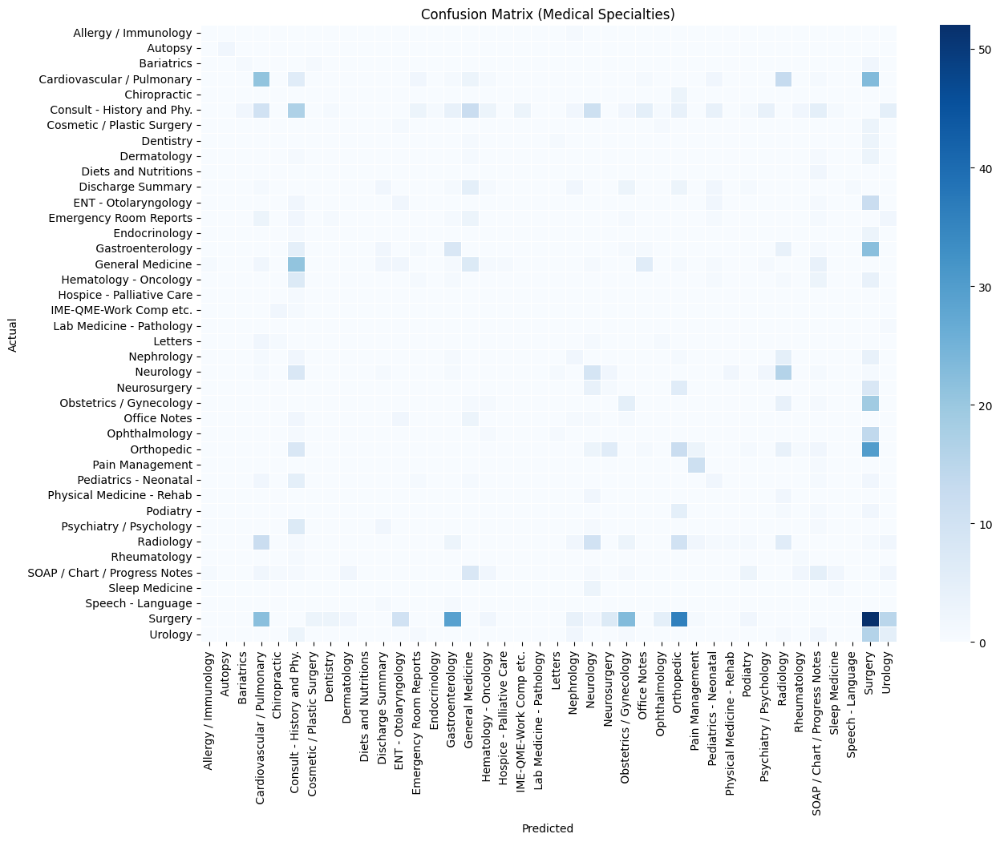

In [0]:
plt.figure(figsize=(14,10))
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm,
            cmap="Blues",
            xticklabels=model.classes_,
            yticklabels=model.classes_,
            linewidths=.5)

plt.title("Confusion Matrix (Medical Specialties)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


In [0]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train_embeddings, y_train)
y_pred_rf = model_rf.predict(X_test_embeddings)

print("Accuracy:", accuracy_score(y_test, y_pred_rf))

Accuracy: 0.07344064386317907
